In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import csv
from skimage.morphology import skeletonize

def find_petri_dish_thresholding(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    petri_dish_contour = None
    min_contour_area = 4000

    for contour in contours:
        if cv2.contourArea(contour) > min_contour_area:
            petri_dish_contour = contour
            break

    x, y, w, h = cv2.boundingRect(petri_dish_contour)
    side_length = max(w, h)
    x_center, y_center = x + w // 2, y + h // 2

    petri_dish = image[y:y + h, x:x + w]
    petri_dish = cv2.resize(petri_dish, (2670, 2670))
    petri_dish_gray = cv2.cvtColor(petri_dish, cv2.COLOR_BGR2GRAY)

    return petri_dish_gray

def extract_medial_axis(binary_image):
    skeleton = skeletonize(binary_image // 255)
    return skeleton

def measure_and_draw_root_lengths(image, skeleton):
    contours, _ = cv2.findContours(skeleton.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    primary_length = 0
    for cnt in contours:
        if len(cnt) > primary_length:
            primary_length = len(cnt)

    # Drawing the longest contour (primary root)
    drawn_image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
    cv2.drawContours(drawn_image, contours, -1, (0, 255, 0), 1)

    return primary_length, drawn_image


## ***Image1***

Primary Root Length: 354 pixels


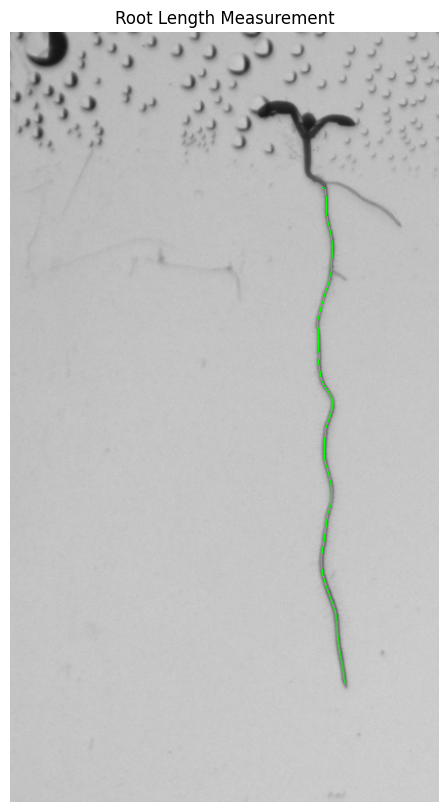

Primary Root Length: 188 pixels


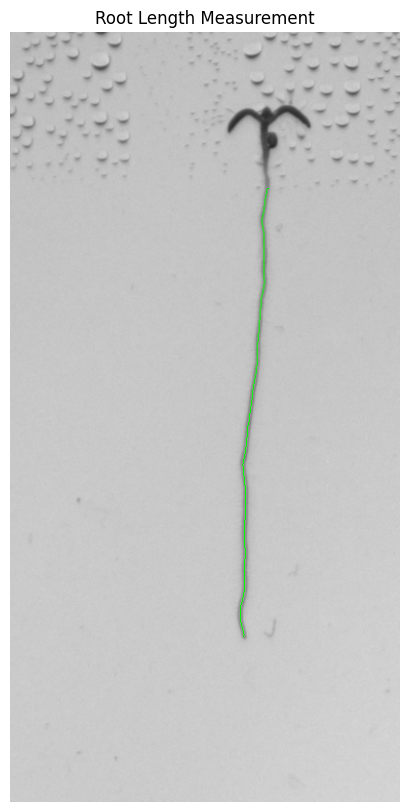

Primary Root Length: 584 pixels


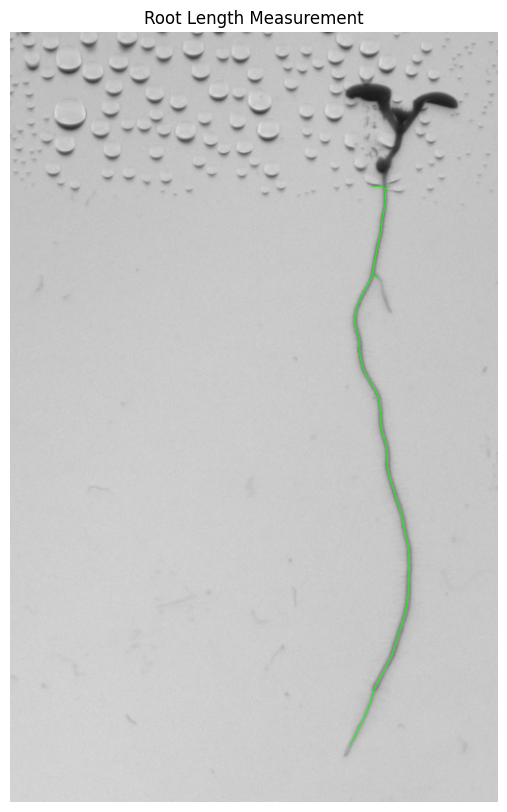

Primary Root Length: 193 pixels


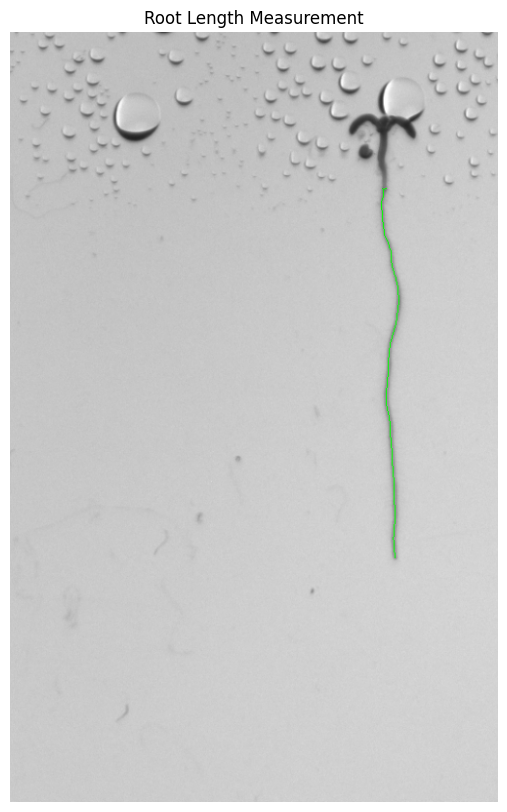

Primary Root Length: 403 pixels


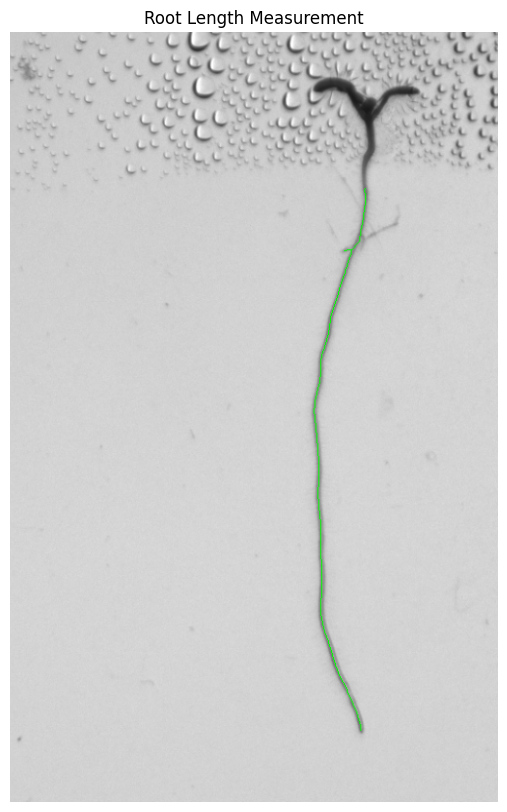

Results saved to root_lengths.csv


In [3]:

def process_plant(image, x_start, x_end, threshold, plant_number, results):
    plants_cropped = image[340:1130, x_start:x_end]
    im = cv2.medianBlur(plants_cropped, 5)
    _, output_im = cv2.threshold(im, threshold, 250, cv2.THRESH_BINARY_INV)
    kernel = np.ones((3, 3), np.uint8)
    output_im = cv2.erode(output_im, kernel, iterations=1)
    output_im = cv2.dilate(output_im, kernel, iterations=1)

    min_area = 1500
    retval, labels, stats, centroids = cv2.connectedComponentsWithStats(output_im)
    plants_only = np.zeros_like(labels, dtype=np.uint8)
    for i in range(1, retval):
        if stats[i, cv2.CC_STAT_AREA] > min_area:
            plants_only[labels == i] = 255

    # Filter to exclude the shoots by focusing on the lower part of the plant
    height, width = plants_only.shape
    plants_only[:height // 5, :] = 0  # Exclude the upper half of the image

    skeleton = extract_medial_axis(plants_only)
    primary_length, drawn_image = measure_and_draw_root_lengths(plants_cropped, skeleton)
    primary_length_rounded = round(primary_length, 2)
    results.append([f"test_image_1_plant_{plant_number}", primary_length_rounded])
    print(f"Primary Root Length: {primary_length} pixels")

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(drawn_image, cv2.COLOR_BGR2RGB))
    plt.title("Root Length Measurement")
    plt.axis('off')
    plt.show()

# List to store the results
results = []

# Process each image and save the results
img_1 = cv2.imread('/content/drive/MyDrive/Datasets/measurementDataset/kagglemeasurements/test_image_1.tif')
petri_dish_1 = find_petri_dish_thresholding(img_1)

# Process each plant with the specified thresholds
process_plant(petri_dish_1, 60, 500, 150, 1, results)
process_plant(petri_dish_1, 600, 1000, 180, 2, results)
process_plant(petri_dish_1, 1000, 1500, 170, 3, results)
process_plant(petri_dish_1, 1500, 2000, 180, 4, results)
process_plant(petri_dish_1, 2000, 2500, 170, 5, results)

# Write the results to a CSV file
with open('root_lengths.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Plant ID", "Primary Root Length (px)"])
    writer.writerows(results)

print("Results saved to root_lengths.csv")


## ***Image2***

Primary Root Length: 856 pixels


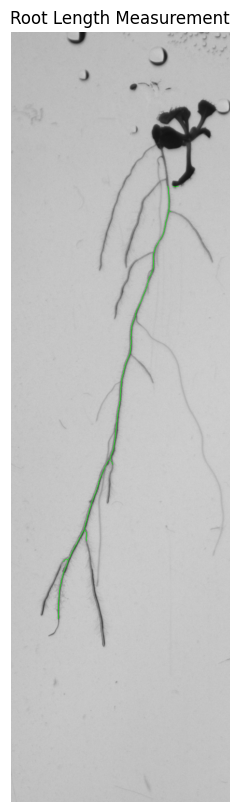

Primary Root Length: 1050 pixels


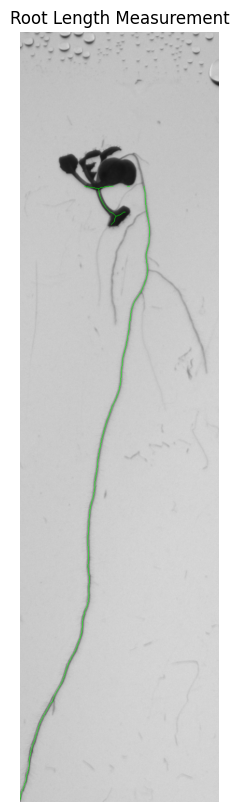

Primary Root Length: 806 pixels


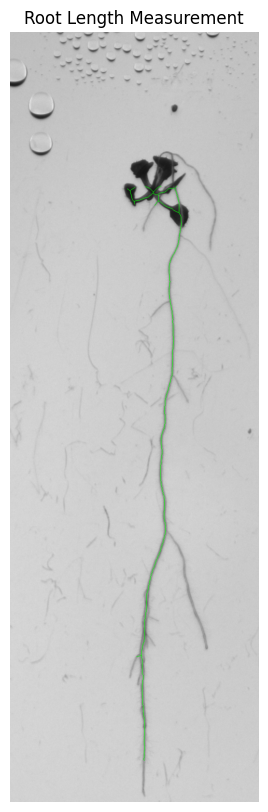

Primary Root Length: 657 pixels


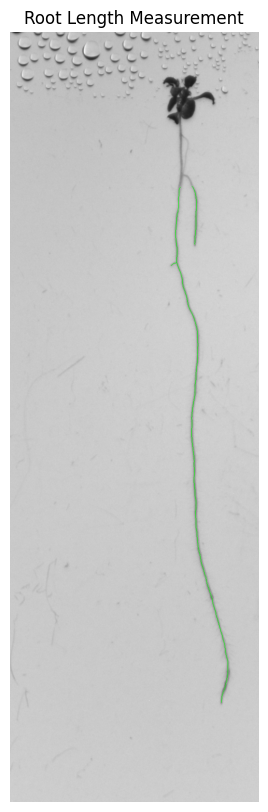

Primary Root Length: 620 pixels


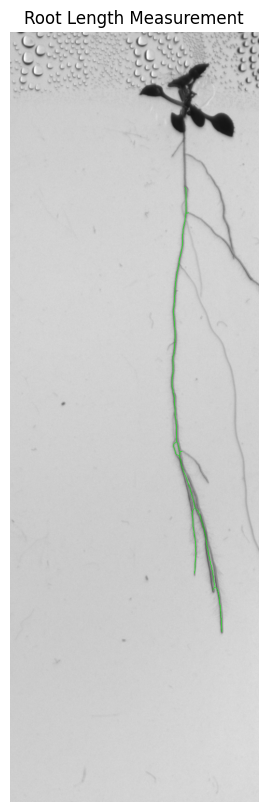

Results saved to root_lengths2.csv


In [4]:
def process_plant(image, x_start, x_end, threshold, plant_number, results):
    plants_cropped = image[350:1900, x_start:x_end]
    im = cv2.medianBlur(plants_cropped, 5)
    _, output_im = cv2.threshold(im, threshold, 250, cv2.THRESH_BINARY_INV)
    kernel = np.ones((3, 3), np.uint8)
    output_im = cv2.erode(output_im, kernel, iterations=1)
    output_im = cv2.dilate(output_im, kernel, iterations=1)

    min_area = 1500
    retval, labels, stats, centroids = cv2.connectedComponentsWithStats(output_im)
    plants_only = np.zeros_like(labels, dtype=np.uint8)
    for i in range(1, retval):
        if stats[i, cv2.CC_STAT_AREA] > min_area:
            plants_only[labels == i] = 255

    # Filter to exclude the shoots by focusing on the lower part of the plant
    height, width = plants_only.shape
    plants_only[:height // 5, :] = 0  # Exclude the upper half of the image

    skeleton = extract_medial_axis(plants_only)
    primary_length, drawn_image = measure_and_draw_root_lengths(plants_cropped, skeleton)
    primary_length_rounded = round(primary_length, 2)
    results.append([f"test_image_2_plant_{plant_number}", primary_length_rounded])
    print(f"Primary Root Length: {primary_length} pixels")

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(drawn_image, cv2.COLOR_BGR2RGB))
    plt.title("Root Length Measurement")
    plt.axis('off')
    plt.show()

# List to store the results
results = []

# Process each image and save the results
img_2 = cv2.imread('/content/drive/MyDrive/Datasets/measurementDataset/kagglemeasurements/test_image_2.tif')
petri_dish_1 = find_petri_dish_thresholding(img_2)

# Process each plant with the specified thresholds
process_plant(petri_dish_1, 60, 500, 150, 1, results)
process_plant(petri_dish_1, 600, 1000, 154, 2, results)
process_plant(petri_dish_1, 1000, 1500, 157, 3, results)
process_plant(petri_dish_1, 1500, 2000, 180, 4, results)
process_plant(petri_dish_1, 2000, 2500, 170, 5, results)

# Write the results to a CSV file
with open('root_lengths2.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Plant ID", "Primary Root Length (px)"])
    writer.writerows(results)

print("Results saved to root_lengths2.csv")


## ***Image3***

Primary Root Length: 1099 pixels


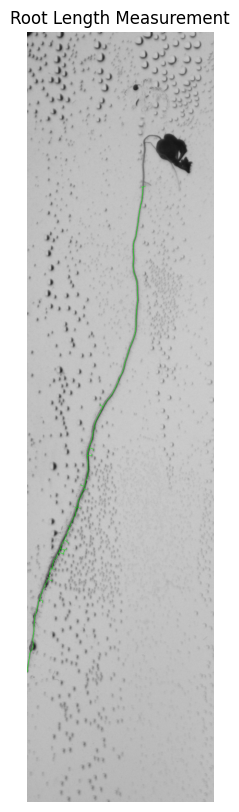

Primary Root Length: 898 pixels


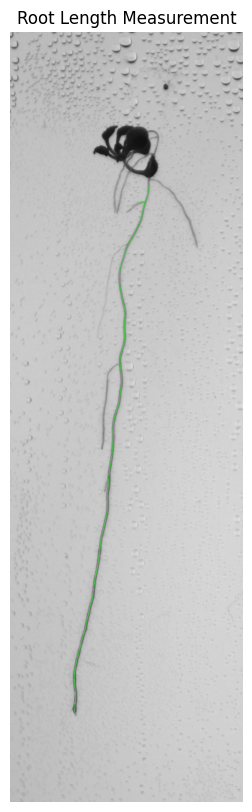

Primary Root Length: 734 pixels


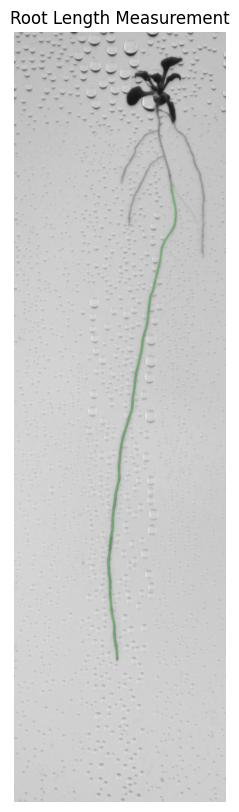

Primary Root Length: 772 pixels


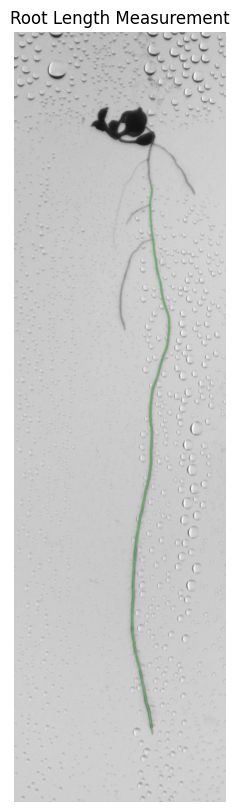

Primary Root Length: 1093 pixels


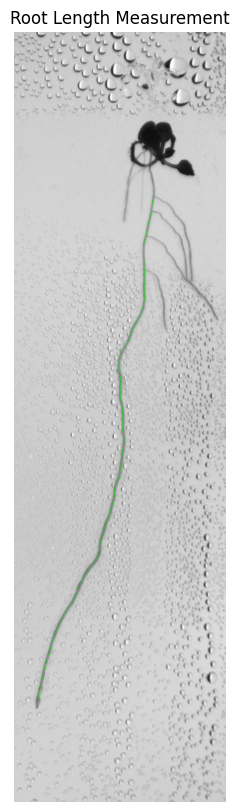

Results saved to root_lengths3.csv


In [5]:
def process_plant(image, x_start, x_end, threshold, plant_number, results):
    plants_cropped = image[350:2170, x_start:x_end]
    im = cv2.medianBlur(plants_cropped, 5)
    _, output_im = cv2.threshold(im, threshold, 250, cv2.THRESH_BINARY_INV)
    kernel = np.ones((3, 3), np.uint8)
    output_im = cv2.erode(output_im, kernel, iterations=1)
    output_im = cv2.dilate(output_im, kernel, iterations=1)

    min_area = 1500
    retval, labels, stats, centroids = cv2.connectedComponentsWithStats(output_im)
    plants_only = np.zeros_like(labels, dtype=np.uint8)
    for i in range(1, retval):
        if stats[i, cv2.CC_STAT_AREA] > min_area:
            plants_only[labels == i] = 255

    # Filter the shoots by focusing on the lower part of the plant
    height, width = plants_only.shape
    plants_only[:height // 5, :] = 0

    skeleton = extract_medial_axis(plants_only)
    primary_length, drawn_image = measure_and_draw_root_lengths(plants_cropped, skeleton)
    primary_length_rounded = round(primary_length, 2)
    results.append([f"test_image_3_plant_{plant_number}", primary_length_rounded])
    print(f"Primary Root Length: {primary_length} pixels")

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(drawn_image, cv2.COLOR_BGR2RGB))
    plt.title("Root Length Measurement")
    plt.axis('off')
    plt.show()

# List to store the results
results = []

# Process each image and save the results
img_2 = cv2.imread('/content/drive/MyDrive/Datasets/measurementDataset/kagglemeasurements/test_image_3.tif')
petri_dish_1 = find_petri_dish_thresholding(img_2)

process_plant(petri_dish_1, 60, 500, 170, 1, results)
process_plant(petri_dish_1, 450, 1000, 160, 2, results)
process_plant(petri_dish_1, 1000, 1500, 160, 3, results)
process_plant(petri_dish_1, 1500, 2000, 160, 4, results)
process_plant(petri_dish_1, 2000, 2500, 160, 5, results)

# Write the results to a CSV file
with open('root_lengths3.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Plant ID", "Primary Root Length (px)"])
    writer.writerows(results)

print("Results saved to root_lengths3.csv")


## ***Image4***

Primary Root Length: 679 pixels


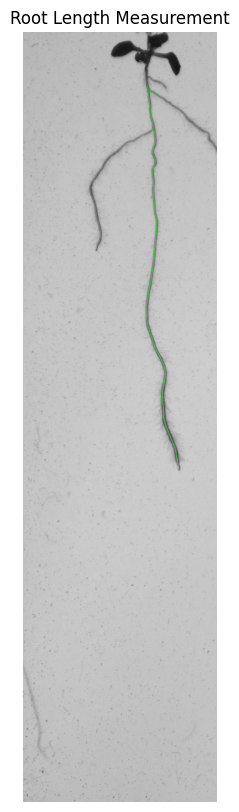

Primary Root Length: 599 pixels


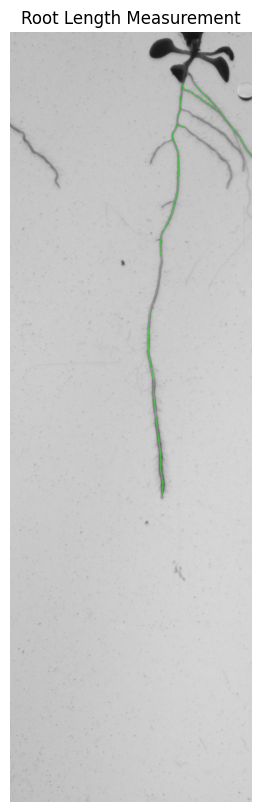

Primary Root Length: 542 pixels


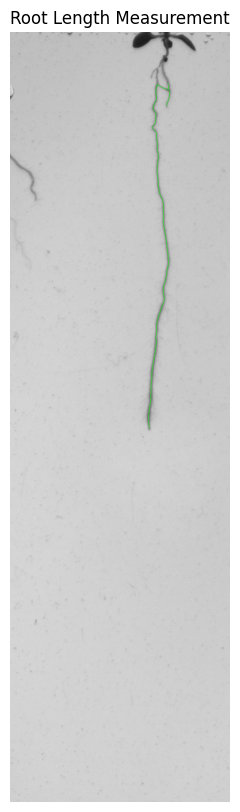

Primary Root Length: 646 pixels


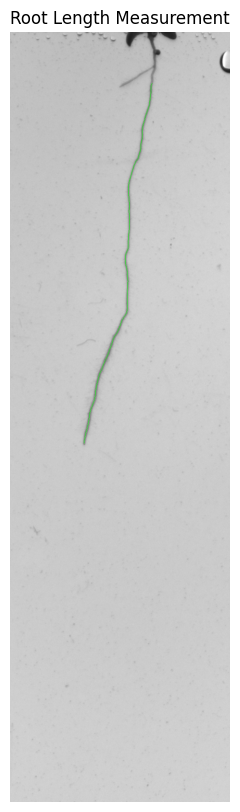

Primary Root Length: 520 pixels


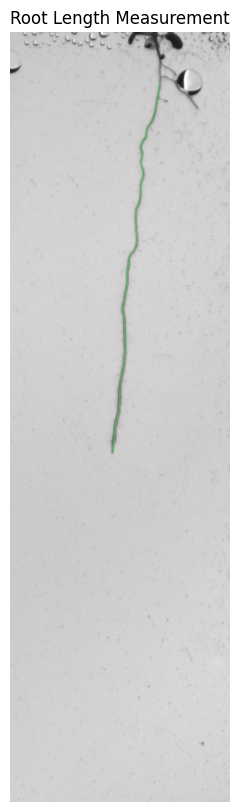

Results saved to root_lengths4.csv


In [6]:
def process_plant(image, x_start, x_end, threshold, plant_number, results):
    plants_cropped = image[350:2100, x_start:x_end]
    im = cv2.medianBlur(plants_cropped, 5)
    _, output_im = cv2.threshold(im, threshold, 250, cv2.THRESH_BINARY_INV)
    kernel = np.ones((3, 3), np.uint8)
    output_im = cv2.erode(output_im, kernel, iterations=1)
    output_im = cv2.dilate(output_im, kernel, iterations=1)

    min_area = 1500
    retval, labels, stats, centroids = cv2.connectedComponentsWithStats(output_im)
    plants_only = np.zeros_like(labels, dtype=np.uint8)
    for i in range(1, retval):
        if stats[i, cv2.CC_STAT_AREA] > min_area:
            plants_only[labels == i] = 255

    # Filter to exclude the shoots by focusing on the lower part of the plant
    height, width = plants_only.shape
    plants_only[:height // 15, :] = 0  # Exclude the upper half of the image

    skeleton = extract_medial_axis(plants_only)
    primary_length, drawn_image = measure_and_draw_root_lengths(plants_cropped, skeleton)
    primary_length_rounded = round(primary_length, 2)
    results.append([f"test_image_4_plant_{plant_number}", primary_length_rounded])
    print(f"Primary Root Length: {primary_length} pixels")

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(drawn_image, cv2.COLOR_BGR2RGB))
    plt.title("Root Length Measurement")
    plt.axis('off')
    plt.show()

# List to store the results
results = []

# Process each image and save the results
img_2 = cv2.imread('/content/drive/MyDrive/Datasets/measurementDataset/kagglemeasurements/test_image_4.tif')
petri_dish_1 = find_petri_dish_thresholding(img_2)

process_plant(petri_dish_1, 60, 500, 136, 1, results)
process_plant(petri_dish_1, 450, 1000, 152, 2, results)
process_plant(petri_dish_1, 1000, 1500, 165, 3, results)
process_plant(petri_dish_1, 1500, 2000, 160, 4, results)
process_plant(petri_dish_1, 2000, 2500, 160, 5, results)

# Write the results to a CSV file
with open('root_lengths4.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Plant ID", "Primary Root Length (px)"])
    writer.writerows(results)

print("Results saved to root_lengths4.csv")


## ***Image5***

Primary Root Length: 879 pixels


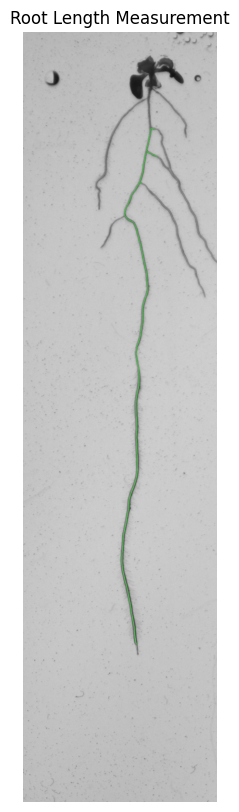

Primary Root Length: 242 pixels


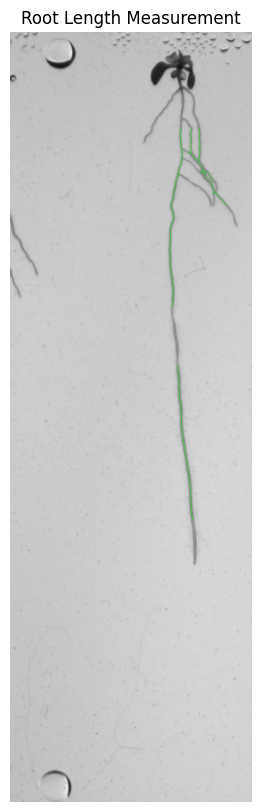

Primary Root Length: 614 pixels


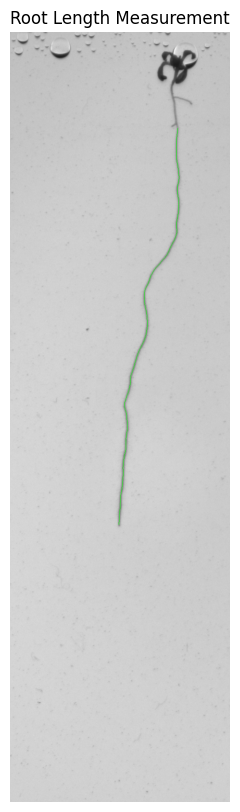

Primary Root Length: 637 pixels


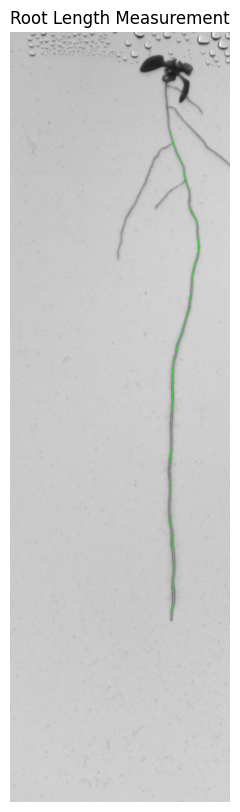

Primary Root Length: 450 pixels


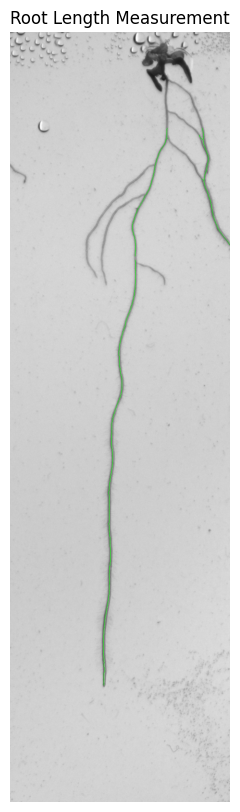

Results saved to root_lengths5.csv


In [7]:
def process_plant(image, x_start, x_end, threshold, plant_number, results):
    plants_cropped = image[350:2100, x_start:x_end]
    im = cv2.medianBlur(plants_cropped, 5)
    _, output_im = cv2.threshold(im, threshold, 250, cv2.THRESH_BINARY_INV)
    kernel = np.ones((3, 3), np.uint8)
    output_im = cv2.erode(output_im, kernel, iterations=1)
    output_im = cv2.dilate(output_im, kernel, iterations=1)

    min_area = 1500
    retval, labels, stats, centroids = cv2.connectedComponentsWithStats(output_im)
    plants_only = np.zeros_like(labels, dtype=np.uint8)
    for i in range(1, retval):
        if stats[i, cv2.CC_STAT_AREA] > min_area:
            plants_only[labels == i] = 255

    # Filter to exclude the shoots by focusing on the lower part of the plant
    height, width = plants_only.shape
    plants_only[:height // 8, :] = 0  # Exclude the upper half of the image

    skeleton = extract_medial_axis(plants_only)
    primary_length, drawn_image = measure_and_draw_root_lengths(plants_cropped, skeleton)
    primary_length_rounded = round(primary_length, 2)
    results.append([f"test_image_5_plant_{plant_number}", primary_length_rounded])
    print(f"Primary Root Length: {primary_length} pixels")

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(drawn_image, cv2.COLOR_BGR2RGB))
    plt.title("Root Length Measurement")
    plt.axis('off')
    plt.show()

# List to store the results
results = []

# Process each image and save the results
img_2 = cv2.imread('/content/drive/MyDrive/Datasets/measurementDataset/kagglemeasurements/test_image_5.tif')
petri_dish_1 = find_petri_dish_thresholding(img_2)

process_plant(petri_dish_1, 60, 500, 141, 1, results)
process_plant(petri_dish_1, 450, 1000, 155, 2, results)
process_plant(petri_dish_1, 1000, 1500, 165, 3, results)
process_plant(petri_dish_1, 1500, 2000, 160, 4, results)
process_plant(petri_dish_1, 2000, 2500, 151, 5, results)

# Write the results to a CSV file
with open('root_lengths5.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Plant ID", "Primary Root Length (px)"])
    writer.writerows(results)

print("Results saved to root_lengths5.csv")


## ***Image6***

Primary Root Length: 0 pixels


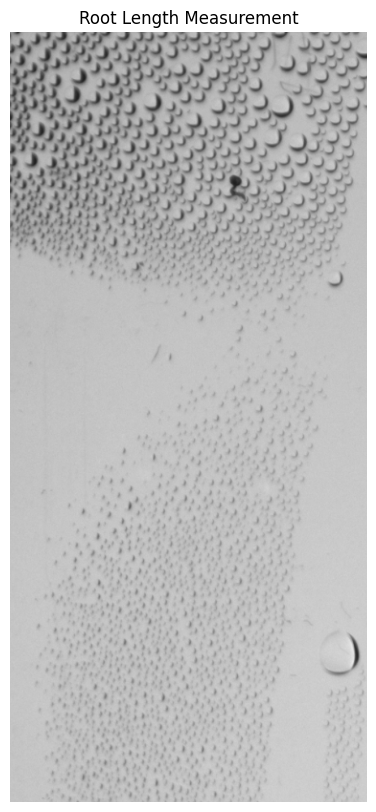

Primary Root Length: 0 pixels


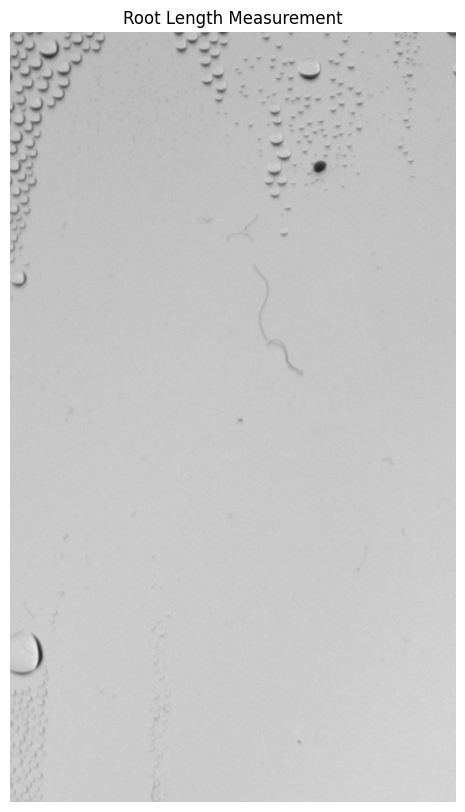

Primary Root Length: 0 pixels


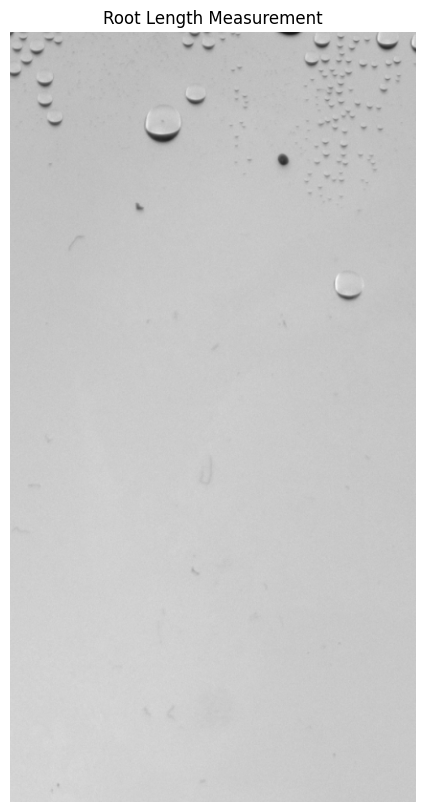

Primary Root Length: 0 pixels


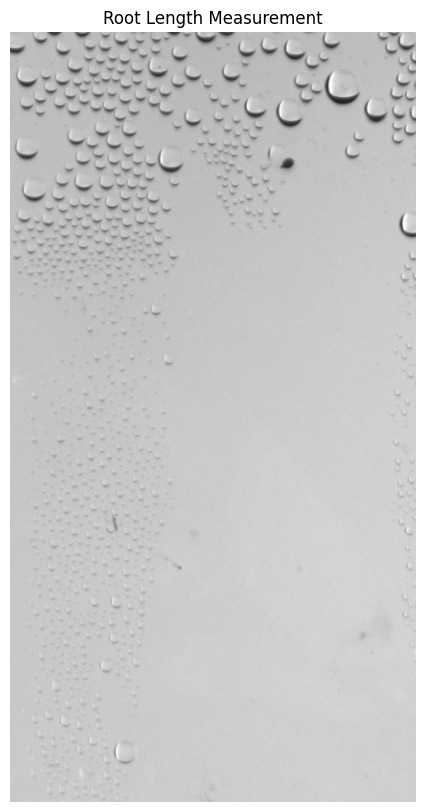

Primary Root Length: 0 pixels


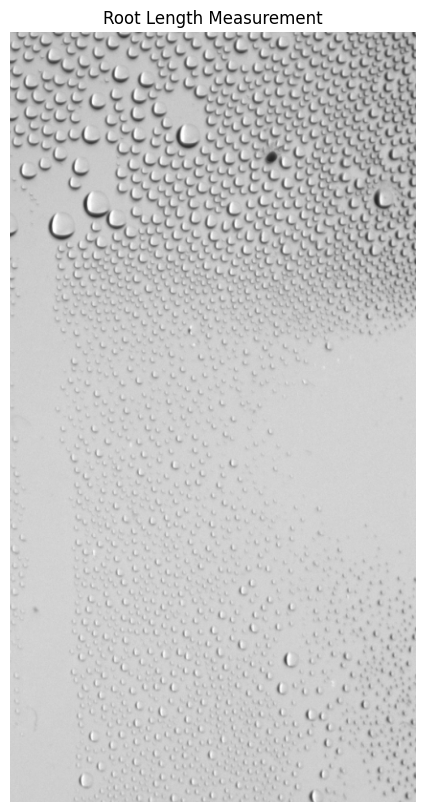

Results saved to root_lengths6.csv


In [8]:
def process_plant(image, x_start, x_end, threshold, plant_number, results):
    plants_cropped = image[250:1200, x_start:x_end]
    im = cv2.medianBlur(plants_cropped, 5)
    _, output_im = cv2.threshold(im, threshold, 250, cv2.THRESH_BINARY_INV)
    kernel = np.ones((3, 3), np.uint8)
    output_im = cv2.erode(output_im, kernel, iterations=1)
    output_im = cv2.dilate(output_im, kernel, iterations=1)

    min_area = 1500
    retval, labels, stats, centroids = cv2.connectedComponentsWithStats(output_im)
    plants_only = np.zeros_like(labels, dtype=np.uint8)
    for i in range(1, retval):
        if stats[i, cv2.CC_STAT_AREA] > min_area:
            plants_only[labels == i] = 255

    # Filter to exclude the shoots by focusing on the lower part of the plant
    height, width = plants_only.shape
    plants_only[:height // 7, :] = 0  # Exclude the upper half of the image

    skeleton = extract_medial_axis(plants_only)
    primary_length, drawn_image = measure_and_draw_root_lengths(plants_cropped, skeleton)
    primary_length_rounded = round(primary_length, 2)
    results.append([f"test_image_6_plant_{plant_number}", primary_length_rounded])
    print(f"Primary Root Length: {primary_length} pixels")

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(drawn_image, cv2.COLOR_BGR2RGB))
    plt.title("Root Length Measurement")
    plt.axis('off')
    plt.show()

# List to store the results
results = []

# Process each image and save the results
img_2 = cv2.imread('/content/drive/MyDrive/Datasets/measurementDataset/kagglemeasurements/test_image_6.tif')
petri_dish_1 = find_petri_dish_thresholding(img_2)

process_plant(petri_dish_1, 60, 500, 11, 1, results)
process_plant(petri_dish_1, 450, 1000, 162, 2, results)
process_plant(petri_dish_1, 1000, 1500, 165, 3, results)
process_plant(petri_dish_1, 1500, 2000, 160, 4, results)
process_plant(petri_dish_1, 2000, 2500, 160, 5, results)
# Write the results to a CSV file
with open('root_lengths6.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Plant ID", "Primary Root Length (px)"])
    writer.writerows(results)

print("Results saved to root_lengths6.csv")


## ***Image7***

Primary Root Length: 0 pixels


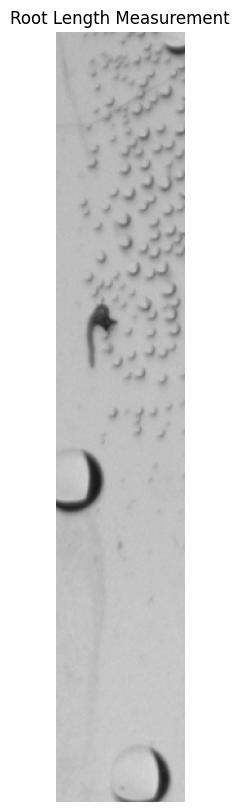

Primary Root Length: 168 pixels


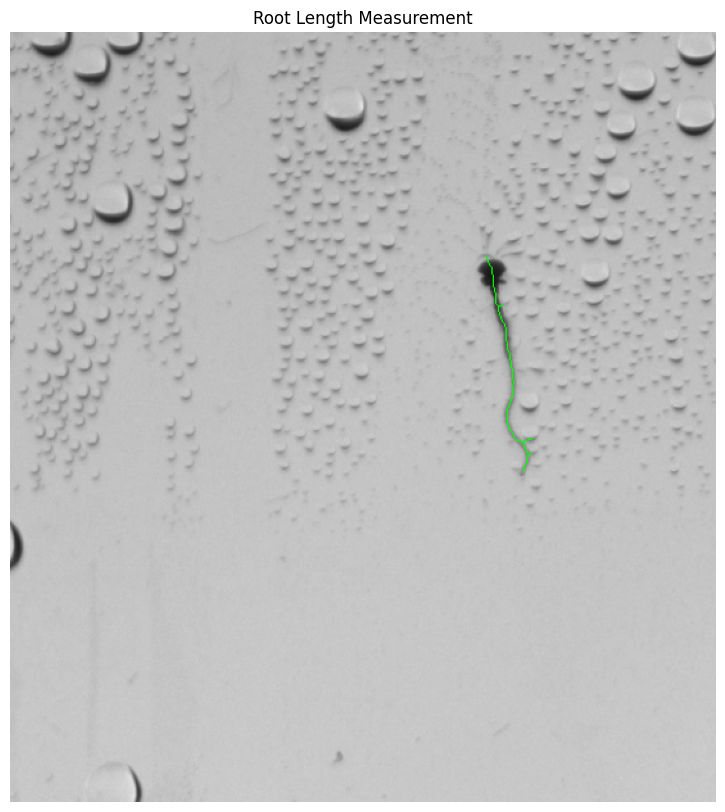

Primary Root Length: 0 pixels


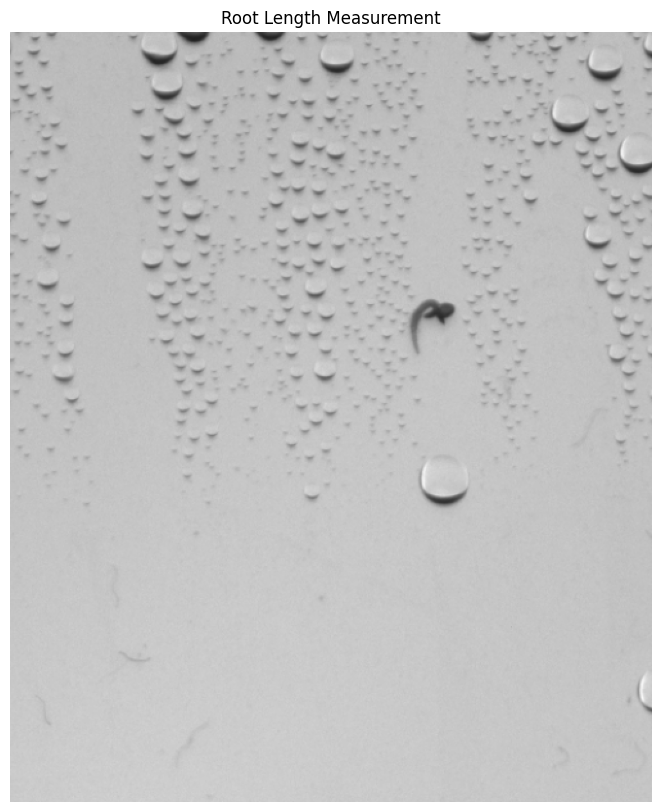

Primary Root Length: 178 pixels


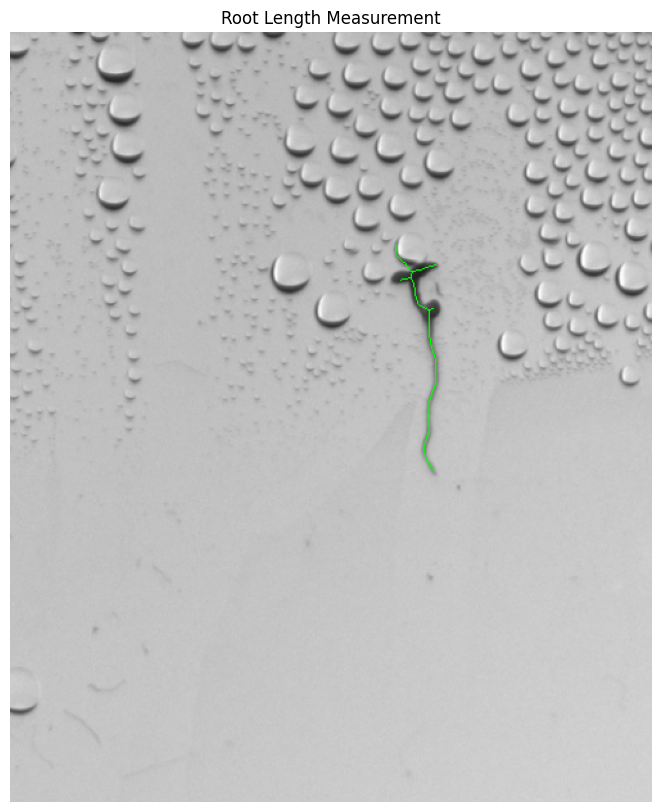

Primary Root Length: 79 pixels


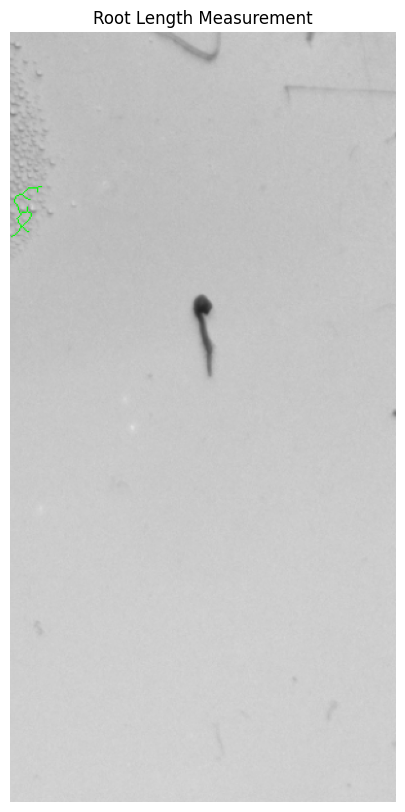

Results saved to root_lengths7.csv


In [9]:
def process_plant(image, x_start, x_end, threshold, plant_number, results):
    plants_cropped = image[200:800, x_start:x_end]
    im = cv2.medianBlur(plants_cropped, 5)
    _, output_im = cv2.threshold(im, threshold, 250, cv2.THRESH_BINARY_INV)
    kernel = np.ones((3, 3), np.uint8)
    output_im = cv2.erode(output_im, kernel, iterations=1)
    output_im = cv2.dilate(output_im, kernel, iterations=1)

    min_area = 1500
    retval, labels, stats, centroids = cv2.connectedComponentsWithStats(output_im)
    plants_only = np.zeros_like(labels, dtype=np.uint8)
    for i in range(1, retval):
        if stats[i, cv2.CC_STAT_AREA] > min_area:
            plants_only[labels == i] = 255

    # Filter to exclude the shoots by focusing on the lower part of the plant
    height, width = plants_only.shape
    plants_only[:height // 5, :] = 0  # Exclude the upper half of the image

    skeleton = extract_medial_axis(plants_only)
    primary_length, drawn_image = measure_and_draw_root_lengths(plants_cropped, skeleton)
    primary_length_rounded = round(primary_length, 2)
    results.append([f"test_image_7_plant_{plant_number}", primary_length_rounded])
    print(f"Primary Root Length: {primary_length} pixels")

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(drawn_image, cv2.COLOR_BGR2RGB))
    plt.title("Root Length Measurement")
    plt.axis('off')
    plt.show()

# List to store the results
results = []

# Process each image and save the results
img_2 = cv2.imread('/content/drive/MyDrive/Datasets/measurementDataset/kagglemeasurements/test_image_7.tif')
petri_dish_1 = find_petri_dish_thresholding(img_2)

process_plant(petri_dish_1, 300, 400, 160, 1, results)
process_plant(petri_dish_1, 450, 1000, 165, 2, results)
process_plant(petri_dish_1, 1000, 1500, 170, 3, results)
process_plant(petri_dish_1, 1500, 2000, 165, 4, results)
process_plant(petri_dish_1, 2200, 2500, 185, 5, results)
# Write the results to a CSV file
with open('root_lengths7.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Plant ID", "Primary Root Length (px)"])
    writer.writerows(results)

print("Results saved to root_lengths7.csv")


## ***Image8***

Primary Root Length: 174 pixels


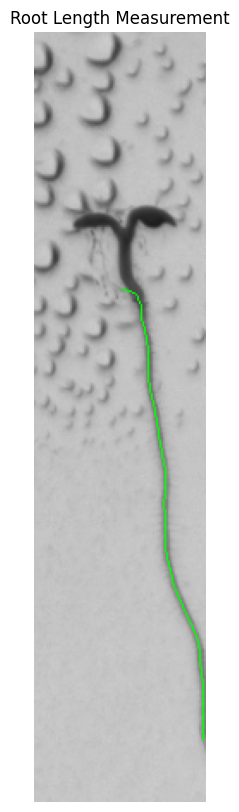

Primary Root Length: 146 pixels


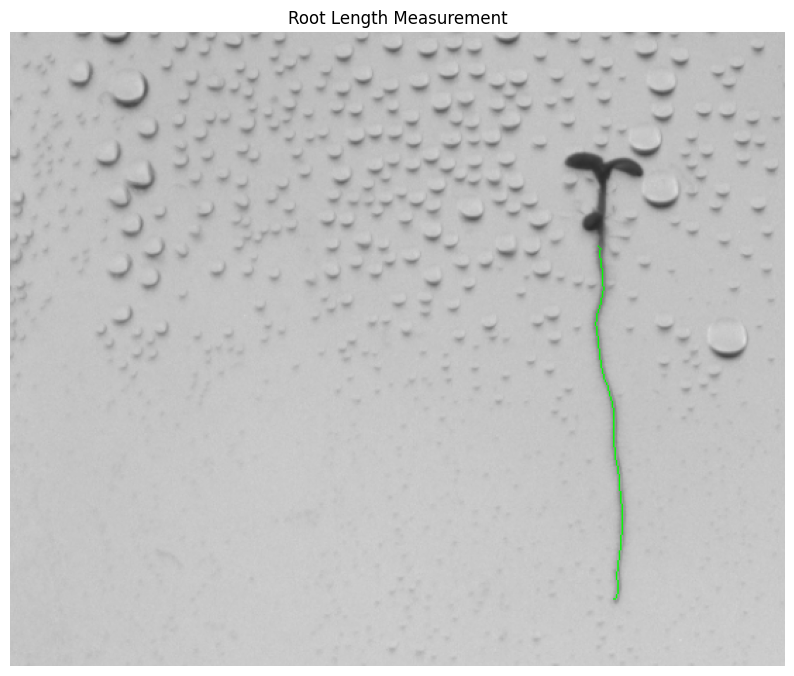

Primary Root Length: 227 pixels


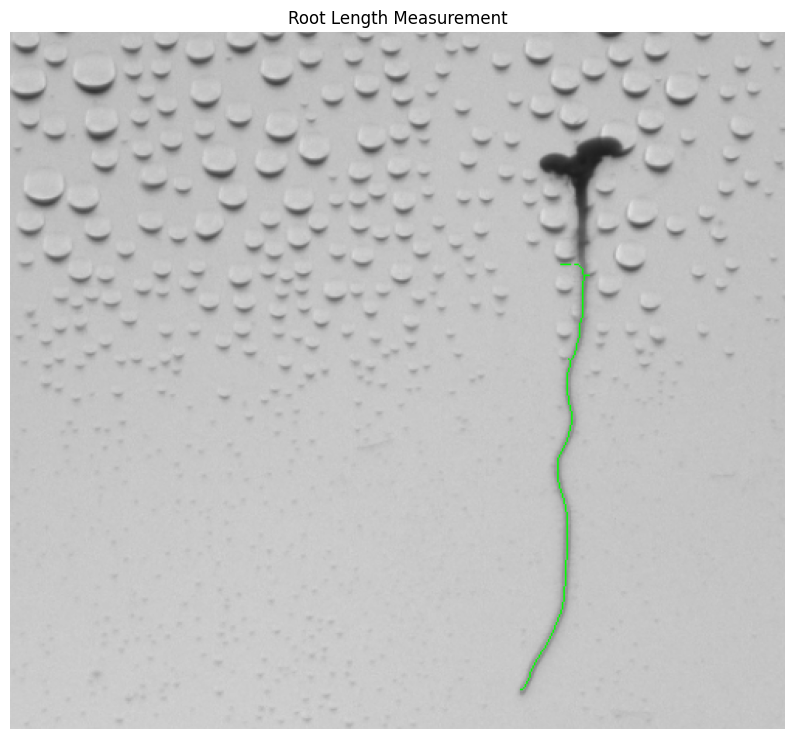

Primary Root Length: 164 pixels


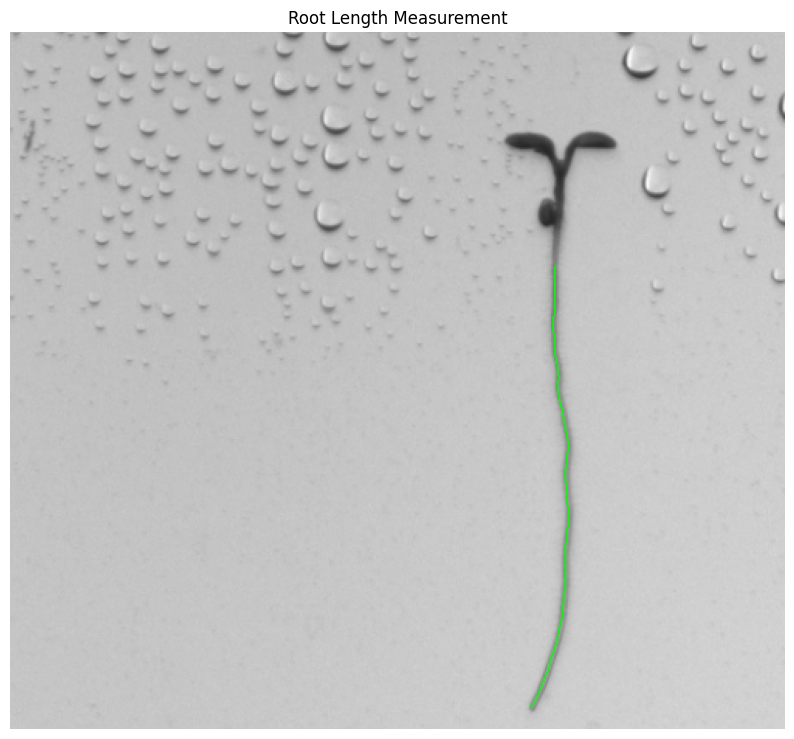

Primary Root Length: 152 pixels


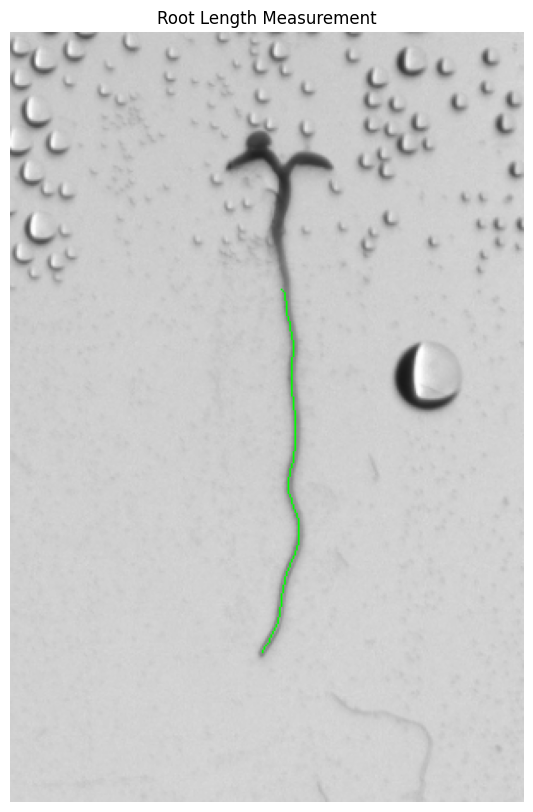

Results saved to root_lengths8.csv


In [10]:
def process_plant(image, x_start, x_end, threshold, plant_number, results):
    plants_cropped = image[350:800, x_start:x_end]
    im = cv2.medianBlur(plants_cropped, 5)
    _, output_im = cv2.threshold(im, threshold, 250, cv2.THRESH_BINARY_INV)
    kernel = np.ones((3, 3), np.uint8)
    output_im = cv2.erode(output_im, kernel, iterations=1)
    output_im = cv2.dilate(output_im, kernel, iterations=1)

    min_area = 1500
    retval, labels, stats, centroids = cv2.connectedComponentsWithStats(output_im)
    plants_only = np.zeros_like(labels, dtype=np.uint8)
    for i in range(1, retval):
        if stats[i, cv2.CC_STAT_AREA] > min_area:
            plants_only[labels == i] = 255

    # Filter to exclude the shoots by focusing on the lower part of the plant
    height, width = plants_only.shape
    plants_only[:height // 3, :] = 0  # Exclude the upper half of the image

    skeleton = extract_medial_axis(plants_only)
    primary_length, drawn_image = measure_and_draw_root_lengths(plants_cropped, skeleton)
    primary_length_rounded = round(primary_length, 2)
    results.append([f"test_image_8_plant_{plant_number}", primary_length_rounded])
    print(f"Primary Root Length: {primary_length} pixels")

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(drawn_image, cv2.COLOR_BGR2RGB))
    plt.title("Root Length Measurement")
    plt.axis('off')
    plt.show()

# List to store the results
results = []

# Process each image and save the results
img_2 = cv2.imread('/content/drive/MyDrive/Datasets/measurementDataset/kagglemeasurements/test_image_8.tif')
petri_dish_1 = find_petri_dish_thresholding(img_2)

process_plant(petri_dish_1, 300, 400, 150, 1, results)
process_plant(petri_dish_1, 450, 1000, 170, 2, results)
process_plant(petri_dish_1, 1000, 1500, 170, 3, results)
process_plant(petri_dish_1, 1500, 2000, 165, 4, results)
process_plant(petri_dish_1, 2200, 2500, 181, 5, results)
# Write the results to a CSV file
with open('root_lengths8.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Plant ID", "Primary Root Length (px)"])
    writer.writerows(results)

print("Results saved to root_lengths8.csv")


## ***Image9***

Primary Root Length: 273 pixels


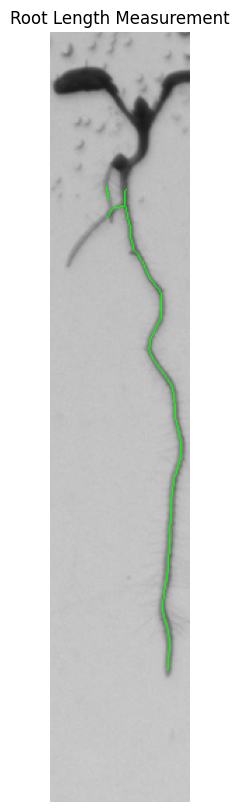

Primary Root Length: 276 pixels


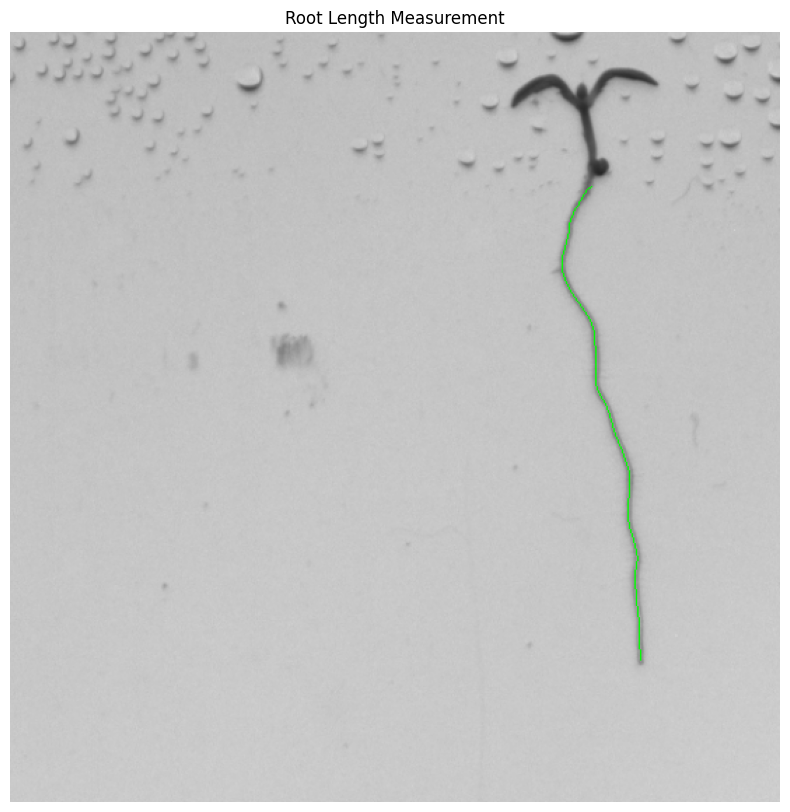

Primary Root Length: 0 pixels


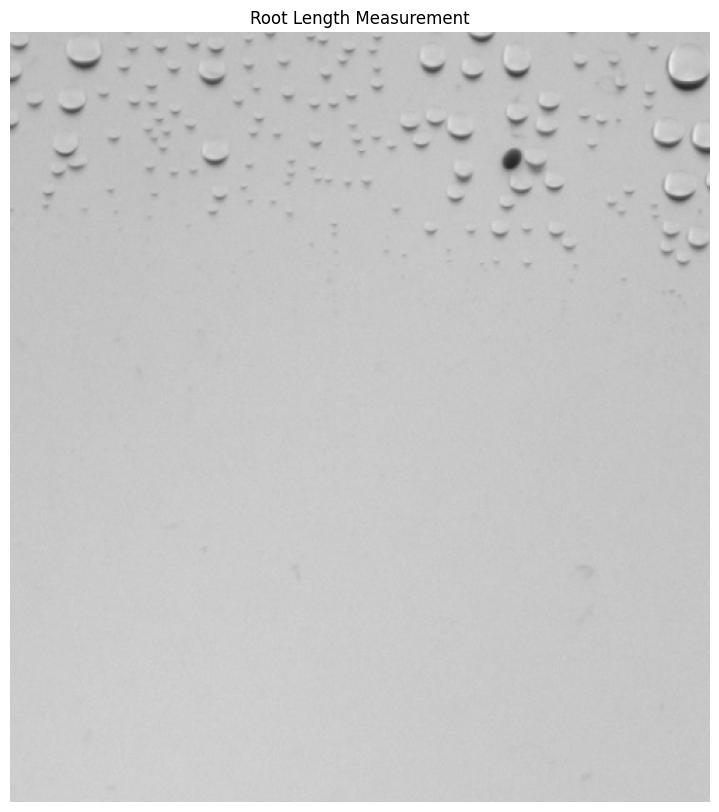

Primary Root Length: 367 pixels


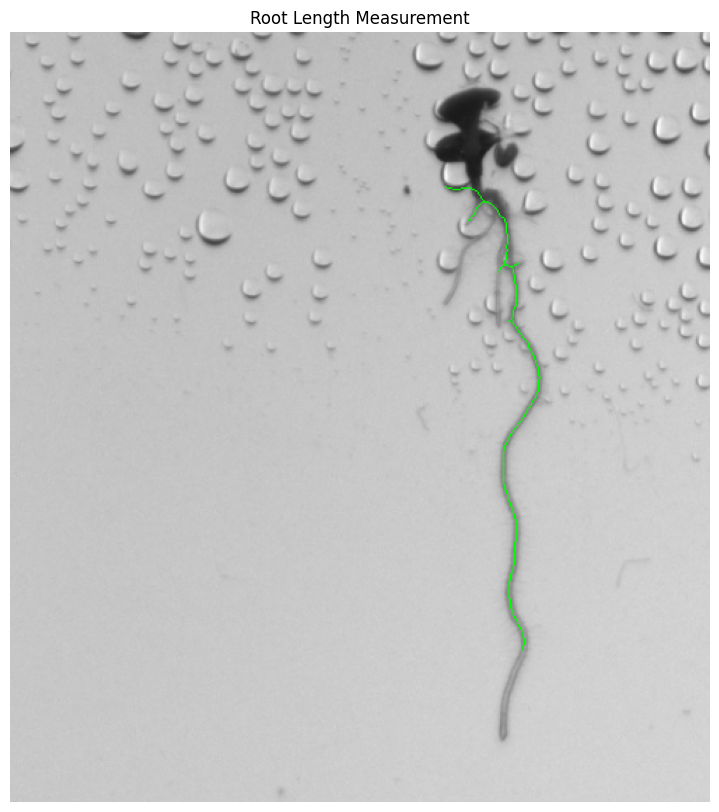

Primary Root Length: 259 pixels


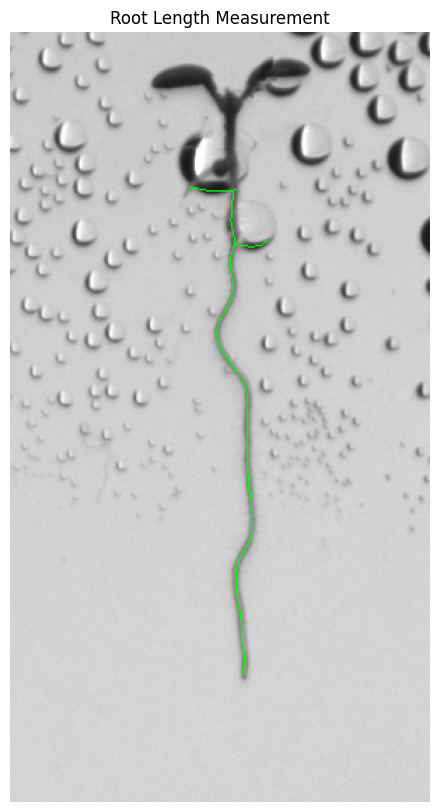

Results saved to root_lengths9.csv


In [11]:
def process_plant(image, x_start, x_end, threshold, plant_number, results):
    plants_cropped = image[350:900, x_start:x_end]
    im = cv2.medianBlur(plants_cropped, 5)
    _, output_im = cv2.threshold(im, threshold, 250, cv2.THRESH_BINARY_INV)
    kernel = np.ones((3, 3), np.uint8)
    output_im = cv2.erode(output_im, kernel, iterations=1)
    output_im = cv2.dilate(output_im, kernel, iterations=1)

    min_area = 1500
    retval, labels, stats, centroids = cv2.connectedComponentsWithStats(output_im)
    plants_only = np.zeros_like(labels, dtype=np.uint8)
    for i in range(1, retval):
        if stats[i, cv2.CC_STAT_AREA] > min_area:
            plants_only[labels == i] = 255

    # Filter to exclude the shoots by focusing on the lower part of the plant
    height, width = plants_only.shape
    plants_only[:height // 5, :] = 0  # Exclude the upper half of the image

    skeleton = extract_medial_axis(plants_only)
    primary_length, drawn_image = measure_and_draw_root_lengths(plants_cropped, skeleton)
    primary_length_rounded = round(primary_length, 2)
    results.append([f"test_image_9_plant_{plant_number}", primary_length_rounded])
    print(f"Primary Root Length: {primary_length} pixels")

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(drawn_image, cv2.COLOR_BGR2RGB))
    plt.title("Root Length Measurement")
    plt.axis('off')
    plt.show()

# List to store the results
results = []

# Process each image and save the results
img_2 = cv2.imread('/content/drive/MyDrive/Datasets/measurementDataset/kagglemeasurements/test_image_9.tif')
petri_dish_1 = find_petri_dish_thresholding(img_2)

process_plant(petri_dish_1, 300, 400, 145, 1, results)
process_plant(petri_dish_1, 450, 1000, 165, 2, results)
process_plant(petri_dish_1, 1000, 1500, 175, 3, results)
process_plant(petri_dish_1, 1500, 2000, 159, 4, results)
process_plant(petri_dish_1, 2200, 2500, 160, 5, results)
# Write the results to a CSV file
with open('root_lengths9.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Plant ID", "Primary Root Length (px)"])
    writer.writerows(results)

print("Results saved to root_lengths9.csv")


## ***Image10***

Primary Root Length: 224 pixels


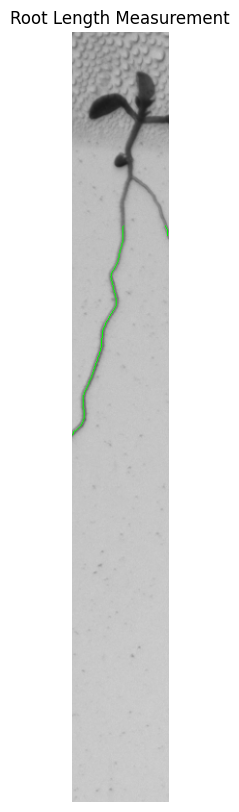

Primary Root Length: 327 pixels


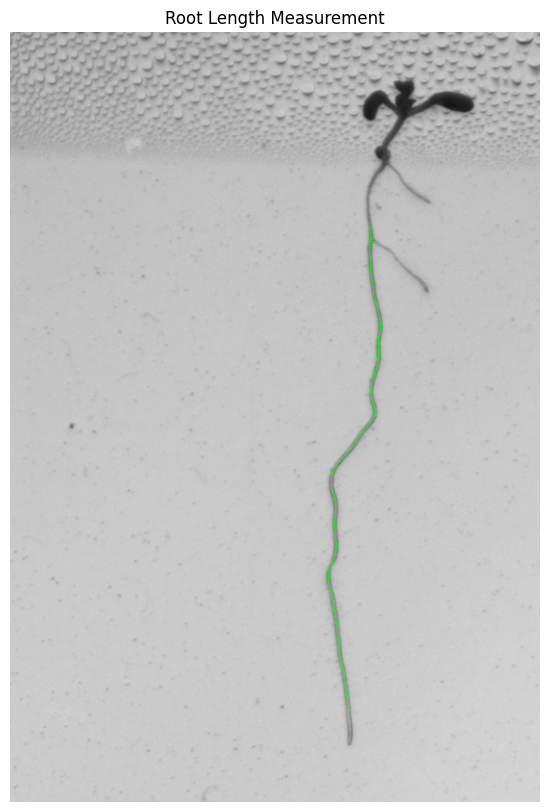

Primary Root Length: 407 pixels


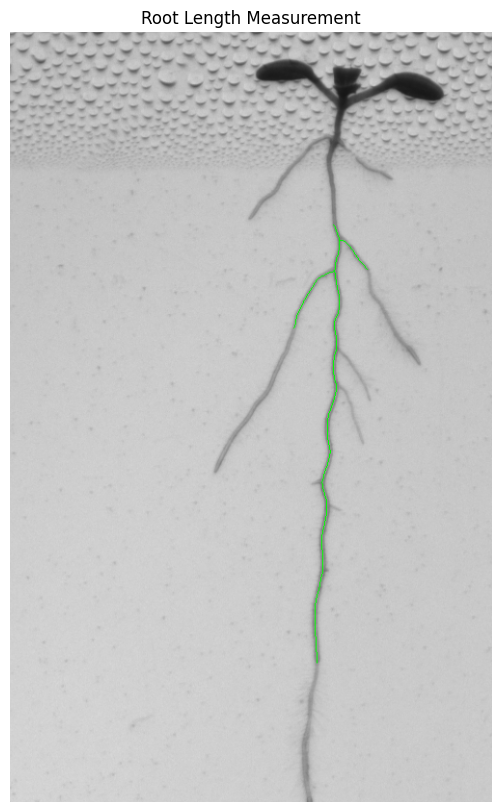

Primary Root Length: 442 pixels


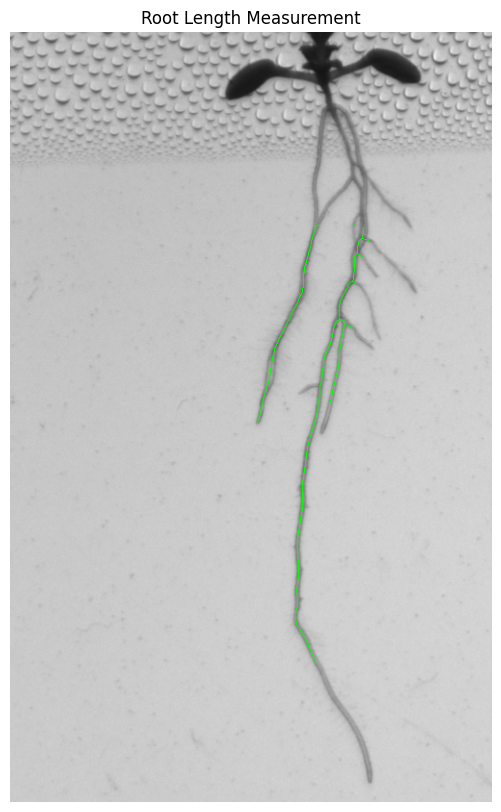

Primary Root Length: 346 pixels


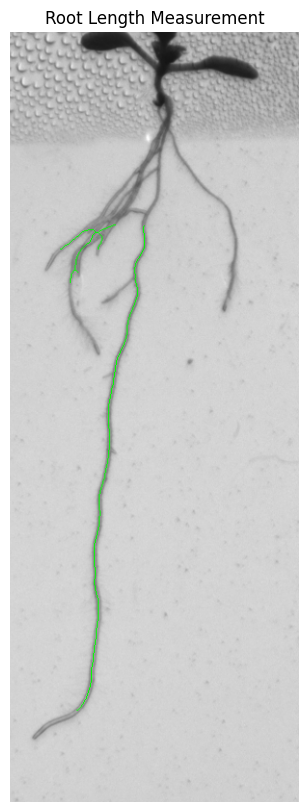

Results saved to root_lengths10.csv


In [12]:
def process_plant(image, x_start, x_end, threshold, plant_number, results):
    plants_cropped = image[350:1150, x_start:x_end]
    im = cv2.medianBlur(plants_cropped, 5)
    _, output_im = cv2.threshold(im, threshold, 250, cv2.THRESH_BINARY_INV)
    kernel = np.ones((3, 3), np.uint8)
    output_im = cv2.erode(output_im, kernel, iterations=1)
    output_im = cv2.dilate(output_im, kernel, iterations=1)

    min_area = 1500
    retval, labels, stats, centroids = cv2.connectedComponentsWithStats(output_im)
    plants_only = np.zeros_like(labels, dtype=np.uint8)
    for i in range(1, retval):
        if stats[i, cv2.CC_STAT_AREA] > min_area:
            plants_only[labels == i] = 255

    # Filter to exclude the shoots by focusing on the lower part of the plant
    height, width = plants_only.shape
    plants_only[:height // 4, :] = 0  # Exclude the upper half of the image

    skeleton = extract_medial_axis(plants_only)
    primary_length, drawn_image = measure_and_draw_root_lengths(plants_cropped, skeleton)
    primary_length_rounded = round(primary_length, 2)
    results.append([f"test_image_10_plant_{plant_number}", primary_length_rounded])
    print(f"Primary Root Length: {primary_length} pixels")

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(drawn_image, cv2.COLOR_BGR2RGB))
    plt.title("Root Length Measurement")
    plt.axis('off')
    plt.show()

# List to store the results
results = []

# Process each image and save the results
img_2 = cv2.imread('/content/drive/MyDrive/Datasets/measurementDataset/kagglemeasurements/test_image_10.tif')
petri_dish_1 = find_petri_dish_thresholding(img_2)

process_plant(petri_dish_1, 300, 400, 150, 1, results)
process_plant(petri_dish_1, 450, 1000, 162, 2, results)
process_plant(petri_dish_1, 1000, 1500, 160, 3, results)
process_plant(petri_dish_1, 1500, 2000, 160, 4, results)
process_plant(petri_dish_1, 2200, 2500, 160, 5, results)
# Write the results to a CSV file
with open('root_lengths10.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Plant ID", "Primary Root Length (px)"])
    writer.writerows(results)

print("Results saved to root_lengths10.csv")


## ***Image11***

Primary Root Length: 538 pixels


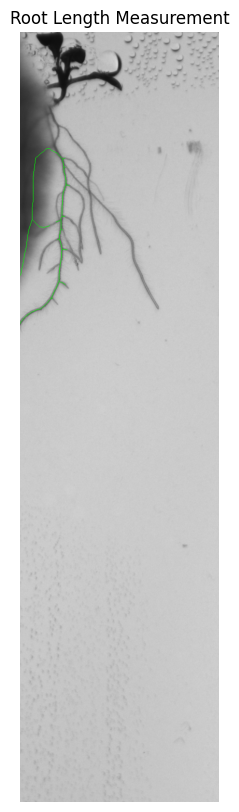

Primary Root Length: 722 pixels


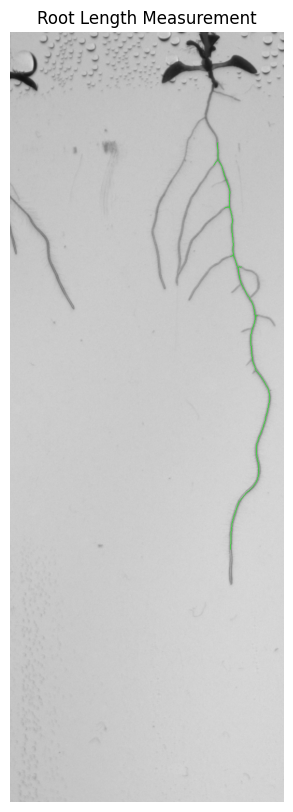

Primary Root Length: 0 pixels


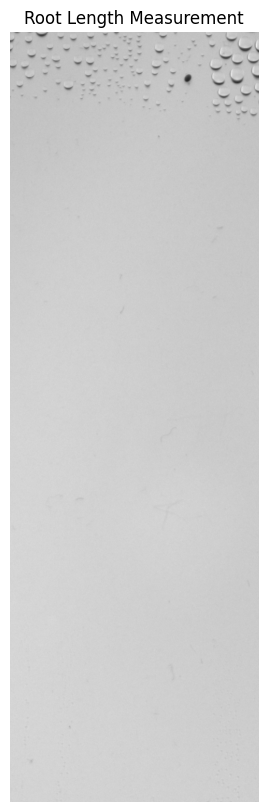

Primary Root Length: 385 pixels


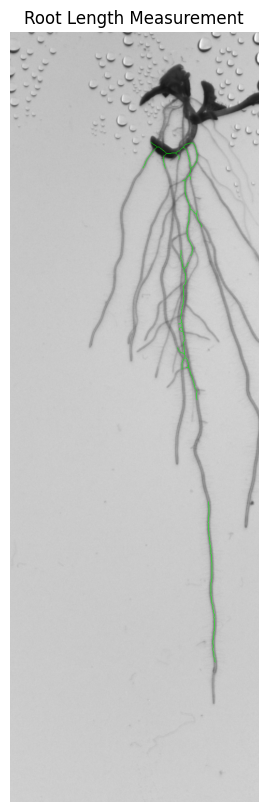

Primary Root Length: 606 pixels


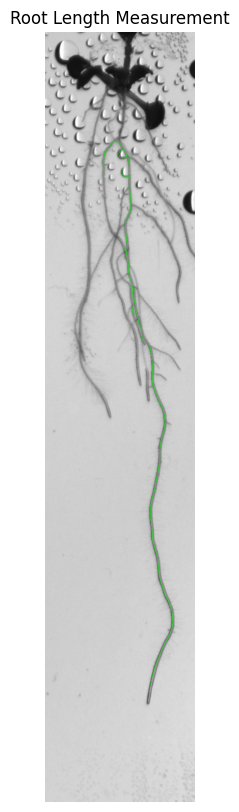

Results saved to root_lengths11.csv


In [13]:
def process_plant(image, x_start, x_end, threshold, plant_number, results):
    plants_cropped = image[350:1900, x_start:x_end]
    im = cv2.medianBlur(plants_cropped, 5)
    _, output_im = cv2.threshold(im, threshold, 250, cv2.THRESH_BINARY_INV)
    kernel = np.ones((3, 3), np.uint8)
    output_im = cv2.erode(output_im, kernel, iterations=1)
    output_im = cv2.dilate(output_im, kernel, iterations=1)

    min_area = 1500
    retval, labels, stats, centroids = cv2.connectedComponentsWithStats(output_im)
    plants_only = np.zeros_like(labels, dtype=np.uint8)
    for i in range(1, retval):
        if stats[i, cv2.CC_STAT_AREA] > min_area:
            plants_only[labels == i] = 255

    # Filter to exclude the shoots by focusing on the lower part of the plant
    height, width = plants_only.shape
    plants_only[:height // 7, :] = 0  # Exclude the upper half of the image

    skeleton = extract_medial_axis(plants_only)
    primary_length, drawn_image = measure_and_draw_root_lengths(plants_cropped, skeleton)
    primary_length_rounded = round(primary_length, 2)
    results.append([f"test_image_11_plant_{plant_number}", primary_length_rounded])
    print(f"Primary Root Length: {primary_length} pixels")

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(drawn_image, cv2.COLOR_BGR2RGB))
    plt.title("Root Length Measurement")
    plt.axis('off')
    plt.show()

# List to store the results
results = []

# Process each image and save the results
img_2 = cv2.imread('/content/drive/MyDrive/Datasets/measurementDataset/kagglemeasurements/test_image_11.tif')
petri_dish_1 = find_petri_dish_thresholding(img_2)

process_plant(petri_dish_1, 300, 700, 137, 1, results)
process_plant(petri_dish_1, 450, 1000, 163, 2, results)
process_plant(petri_dish_1, 1000, 1500, 155, 3, results)
process_plant(petri_dish_1, 1500, 2000, 148, 4, results)
process_plant(petri_dish_1, 2200, 2500, 141, 5, results)
# Write the results to a CSV file
with open('root_lengths11.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Plant ID", "Primary Root Length (px)"])
    writer.writerows(results)

print("Results saved to root_lengths11.csv")


In [14]:
import pandas as pd

# Read the two CSV files
df1 = pd.read_csv('/content/root_lengths.csv')
df2 = pd.read_csv('/content/root_lengths2.csv')
df3 = pd.read_csv('/content/root_lengths3.csv')
df4 = pd.read_csv('/content/root_lengths4.csv')
df5 = pd.read_csv('/content/root_lengths5.csv')
df6 = pd.read_csv('/content/root_lengths6.csv')
df7 = pd.read_csv('/content/root_lengths7.csv')
df8 = pd.read_csv('/content/root_lengths8.csv')
df9 = pd.read_csv('/content/root_lengths9.csv')
df10 = pd.read_csv('/content/root_lengths10.csv')
df11 = pd.read_csv('/content/root_lengths11.csv')
# Combine the dataframes
combined_df = pd.concat([df1, df2, df3, df4, df5, df6, df7, df8, df9, df10, df11], ignore_index=True)

# Save the combined dataframe to a new CSV file
combined_df.to_csv('3rd_root_lengths.csv', index=False)

print("Combined CSV saved as '3rd_root_lengths.csv'")

Combined CSV saved as '3rd_root_lengths.csv'
